# Import Library

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from keras.preprocessing.text import Tokenizer
from keras_preprocessing import sequence

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models.word2vec import Word2Vec
from gensim.models.keyedvectors import KeyedVectors
# import fasttext

import keras
from keras.layers import Input, Bidirectional, LSTM, Embedding, Dense, Dropout, Conv1D, MaxPooling1D, Flatten, TextVectorization
from keras.models import Model, Sequential
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from sklearn import svm, naive_bayes
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

from sklearn.preprocessing import MinMaxScaler

import seaborn as sn
import matplotlib.pyplot as plt

2022-08-18 15:38:34.101227: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


# Load Data

Convert Label to Integer

In [2]:
# data = pd.read_csv(path+"clean_blt_data_5000_labeled.csv")
# data['Label'] = data['Label'].astype('category').cat.codes
data = pd.read_csv("data/tweets_labelled_nltk.csv")

def merge_neutral(text):
    if text == "Netral":
        return "Positif"
    if text == "Positif":
        return "Positif"
    else:
        return "Negatif"

data['sentimen'] = data['sentimen'].apply(merge_neutral)
data

data['Label'] = data['sentimen'].astype('category').cat.codes
data['Comment'] = data['tweet'].astype('U')
data['Tweet'] = data['tweet'].astype('U')
data = data.drop('tweet', axis=1)

In [3]:
data.head(20)

,sentimen,Label,Comment,Tweet
0,Positif,1,menangani kekerasan seksual disahkan enam ...,menangani kekerasan seksual disahkan enam ...
1,Positif,1,menangani kekerasan seksual disahkan enam ...,menangani kekerasan seksual disahkan enam ...
2,Negatif,0,wakil mpr ri mahasiswa kawal implementasi,wakil mpr ri mahasiswa kawal implementasi
3,Negatif,0,fadel muhammad mahasiswa kawal implementasi,fadel muhammad mahasiswa kawal implementasi
4,Negatif,0,tanggal chatnya april dijerat,tanggal chatnya april dijerat
5,Positif,1,kelakuan gini ranah,kelakuan gini ranah
6,Negatif,0,membuka sistem peradilan diharapkan implem...,membuka sistem peradilan diharapkan implem...
7,Negatif,0,mochammad abizar yusro terang sinar perli...,mochammad abizar yusro terang sinar perli...
8,Positif,1,pengesahan undang undang bentuk hadiah per...,pengesahan undang undang bentuk hadiah per...
9,Positif,1,ri penghargaan elemen perempuan pengesahan...,ri penghargaan elemen perempuan pengesahan...


Split Data to Train and Test

In [4]:
X = data['Tweet']
y = data['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.1, stratify=y)

Convert Word to Integer (Index) and Label to One Hot Encoding

In [5]:
max_seq_len = sum([len(x) for x in data['Tweet'].values]) / len([len(x) for x in data['Tweet'].values])
print(max_seq_len)
max_seq_len = np.round(max_seq_len).astype(int)
print("maximun sequence length : ", max_seq_len)
max_db_words = 100000

print("tokenizing input data...")
tokenizer = Tokenizer(num_words=max_db_words, lower=True, char_level=False)
tokenizer.fit_on_texts(list(data['Tweet'].values))  #leaky
word_seq_train = tokenizer.texts_to_sequences(list(X_train.values))
word_seq_test = tokenizer.texts_to_sequences(list(X_test.values))
word_index = tokenizer.word_index
print("dictionary size: ", len(word_index))

#pad sequences
word_seq_train = sequence.pad_sequences(word_seq_train, maxlen=max_seq_len)
word_seq_test = sequence.pad_sequences(word_seq_test, maxlen=max_seq_len)

74.12634339815763
maximun sequence length :  74
tokenizing input data...
dictionary size:  11157


In [6]:
y_seq_train = to_categorical(y_train, num_classes = 2)
y_seq_test = to_categorical(y_test, num_classes = 2)

#Word Representation

In [7]:
#TF-IDF

tfidf = TfidfVectorizer()
tfidf.fit(data['Tweet'].astype('U').tolist())
tfidf_train = tfidf.transform(X_train.values)
tfidf_test = tfidf.transform(X_test.values)

In [8]:
tfidf_train_df = pd.DataFrame(tfidf_train.todense(), columns=tfidf.get_feature_names_out())
tfidf_train_df

,aaaa,aaaaa,aaaaaa,aaaaaaa,aaaaaaaaaaaa,aaaaaaaaaaaaaaaaaaaaaa,aaaaaaaarghhh,aaaaamiiiiin,aaamin,aamiiiin,...,zidan,zina,zinah,zinahal,zinalah,zinaseks,zona,zoom,zuhro,zuzur
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14063,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14064,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14065,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14066,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
tfidf_test_df = pd.DataFrame(tfidf_test.todense(), columns=tfidf.get_feature_names_out())
tfidf_test_df

,aaaa,aaaaa,aaaaaa,aaaaaaa,aaaaaaaaaaaa,aaaaaaaaaaaaaaaaaaaaaa,aaaaaaaarghhh,aaaaamiiiiin,aaamin,aamiiiin,...,zidan,zina,zinah,zinahal,zinalah,zinaseks,zona,zoom,zuhro,zuzur
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1559,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1560,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1561,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1562,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
#Bag of Words

countword = CountVectorizer()
countword.fit(data['Tweet'].astype('U').tolist())
countword_train = countword.transform(X_train.values)
countword_test = countword.transform(X_test.values)

In [11]:
count_vect_train_df = pd.DataFrame(countword_train.todense(), columns=countword.get_feature_names_out())
count_vect_train_df

,aaaa,aaaaa,aaaaaa,aaaaaaa,aaaaaaaaaaaa,aaaaaaaaaaaaaaaaaaaaaa,aaaaaaaarghhh,aaaaamiiiiin,aaamin,aamiiiin,...,zidan,zina,zinah,zinahal,zinalah,zinaseks,zona,zoom,zuhro,zuzur
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14063,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14064,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14065,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14066,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
count_vect_test_df = pd.DataFrame(countword_test.todense(), columns=countword.get_feature_names_out())
count_vect_test_df

,aaaa,aaaaa,aaaaaa,aaaaaaa,aaaaaaaaaaaa,aaaaaaaaaaaaaaaaaaaaaa,aaaaaaaarghhh,aaaaamiiiiin,aaamin,aamiiiin,...,zidan,zina,zinah,zinahal,zinalah,zinaseks,zona,zoom,zuhro,zuzur
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1559,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1560,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1561,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1562,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
#Word2Vec

list_of_sentences = []
for x in list(data['Tweet'].values):
  temp = x.split()
  list_of_sentences.append(temp)

word_model = Word2Vec(list_of_sentences, vector_size=106, min_count=1, window=5, epochs=100)
pretrained_weights = word_model.wv.vectors

words_not_found = []
embed_dim = 106
nb_words = len(word_index) + 1
embedding_matrix_2 = np.zeros((nb_words, embed_dim))

for i, word in word_index.items():
    try:
        embedding_matrix_2[word, :] = word_model.wv[i]
    except KeyError:
        pass

In [14]:
for i, word in word_index.items():
    try:
        print(i)
        print(word_model.wv[i])
        print("="*30)
    except KeyError:
        pass

disahkan
[ 1.1858896   0.26768562  0.4241115  -0.38723117  0.7947629  -0.83394206
  1.1462189   1.2244014   0.80080616  1.5407515  -0.5957087   0.6850033
  0.37898275 -0.36452913  0.7383907  -1.0232776   0.16347535  0.02533344
 -0.40011784 -0.4744658   1.2464029   1.3766264   1.3807678  -1.3186475
 -0.4303891  -0.75067014  1.4394442   1.0962602  -1.0951539  -0.26157606
 -0.35148045 -1.1068473   0.05420951  0.1975787  -0.8641609   0.10783178
  1.4631134   0.16231771 -1.482059    2.1683083   0.07396139  0.49755883
 -2.4469244  -0.1135962  -0.42193267  0.08231516 -1.0968632  -0.8218008
  0.93814516 -0.422008   -0.7452463  -0.42536393  0.48101503  0.962826
  1.4546875  -2.634899   -0.44561008  0.16208303  0.07123065 -1.7720383
  0.24587548  1.7219589  -1.8357263   0.36295652 -0.97926205  1.2617201
  0.7846659   0.2672145   1.2324564  -1.1338481   1.6664541   0.53623337
 -1.7293932  -1.5132846  -0.1506262  -1.5323094   0.37932795 -0.6741314
 -0.9761963   0.12643668  0.5212678   0.18304132 -

In [15]:
# #Fasttext

# ### OPEN THIS CODE IF YOU WANT TO TRAIN FASTTEXT MODEL ###

# with open(path + 'Word_Embedding_Fasttext/data_train.txt', 'a') as f:
#     for x in range(0, len(X_train)):
#         f.write("__label__"+ str(y_train.values[x]) + " " +X_train.values[x] + "\n")

# with open(path + 'Word_Embedding_Fasttext/data_test.txt', 'a') as f:
#     for x in range(0, len(X_test)):
#         f.write("__label__"+ str(y_test.values[x]) + " " +X_test.values[x] + "\n")

# model_fasttext = fasttext.train_supervised(input=path + 'Word_Embedding_Fasttext/data_train.txt', autotuneValidationFile=path + 'Word_Embedding_Fasttext/data_test.txt')
# # model_fasttext.save_model(path + 'Word_Embedding_Fasttext/model_1_textblob.bin')

# ### OPEN THIS CODE IF YOU WANT TO LOAD FASTTEXT MODEL ###

# # model_fasttext = fasttext.load_model(path + 'Word_Embedding_Fasttext/model.bin')

# ########################################################################################################

# np.random.seed(0)
# print('preparing embedding matrix...')

# words_not_found = []
# embed_dim = len(model_fasttext['tes'])
# nb_words = max(len(model_fasttext.words), len(word_index)) +1
# embedding_matrix = np.zeros((nb_words, embed_dim))

# for i, word in enumerate(model_fasttext.words):
#     if i >= nb_words:
#         continue
#     embedding_vector = model_fasttext[word]
#     if (embedding_vector is not None) and len(embedding_vector) > 0:
#         # words not found in embedding index will be all-zeros.
#         embedding_matrix[i] = embedding_vector
#     else:
#         words_not_found.append(word)
# print('number of null word embeddings: %d' % np.sum(np.sum(embedding_matrix, axis=1) == 0))

In [16]:
# for i, word in enumerate(model_fasttext.words):
#     if i >= nb_words:
#         continue
#     embedding_vector = model_fasttext[word]
#     if (embedding_vector is not None) and len(embedding_vector) > 0:
#         # words not found in embedding index will be all-zeros.
#         print(word)
#         print(embedding_vector)
#         print("="*30)
#     else:
#         words_not_found.append(word)

# Evaluation Function

In [17]:
def plot_matrix(y_test, y_pred):
  cnf_matrix = confusion_matrix(y_test, y_pred)
  index = ["negative", "positive"]
  columns = ["negative", "positive"]
  df_cm = pd.DataFrame(cnf_matrix,columns,index)

  sn.heatmap(df_cm, annot=True, cmap=plt.cm.Blues, fmt=".0f", annot_kws={"size": 10}) # font size
  plt.xlabel("Predicted label", fontsize = 10)
  plt.ylabel("True label", fontsize = 10)

  plt.show()

In [18]:
def false_cases(sentences, y_test, y_pred):
  df = pd.DataFrame(list(zip(sentences, y_test, y_pred)), columns=["sentence", "label", "prediction"])
  df = df[df['label'] != df['prediction']]
  return df


In [19]:
target_names = ["negative", "positive"]

# Deep Learning

## ANN

### Fastext

In [20]:
# ann_fasttext = Sequential()
# ann_fasttext.add(Embedding(nb_words, 33, input_length=max_seq_len, weights=[embedding_matrix])) #embedding_matrix_2 = word2vec ; embedding_matrix = fasttext
# ann_fasttext.add(Dense(10, activation='relu'))
# ann_fasttext.add(Dropout(0.2))
# ann_fasttext.add(Dense(5, activation='relu'))
# ann_fasttext.add(Flatten())
# ann_fasttext.add(Dense(2, activation='softmax'))
# ann_fasttext.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# ann_fasttext.summary()

# ann_fasttext.fit(word_seq_train, y_seq_train, epochs=10, validation_data=(word_seq_test, y_seq_test))

In [21]:
# y_pred = ann_fasttext.predict(word_seq_test, verbose=0)
# y_pred = np.argmax(y_pred, axis=1)

In [22]:
# print(classification_report(y_test, y_pred, target_names=target_names))

In [23]:
# plot_matrix(y_test, y_pred)

In [24]:
# pred_result = false_cases(X_test, y_test, y_pred)
# pred_result

### Word2Vec

In [25]:
ann_word2vec = Sequential()
ann_word2vec.add(Embedding(nb_words, 106, input_length=max_seq_len, weights=[embedding_matrix_2])) #embedding_matrix_2 = word2vec ; embedding_matrix = fasttext
ann_word2vec.add(Dense(10, activation='relu'))
ann_word2vec.add(Dropout(0.2))
ann_word2vec.add(Dense(5, activation='relu'))
ann_word2vec.add(Flatten())
ann_word2vec.add(Dense(2, activation='softmax'))
ann_word2vec.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
ann_word2vec.summary()

ann_word2vec.fit(word_seq_train, y_seq_train, epochs=10, validation_data=(word_seq_test, y_seq_test))

2022-08-18 15:38:50.066448: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-18 15:38:50.099669: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-18 15:38:50.100480: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-18 15:38:50.101410: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 74, 106)           1182748   
                                                                 
 dense (Dense)               (None, 74, 10)            1070      
                                                                 
 dropout (Dropout)           (None, 74, 10)            0         
                                                                 
 dense_1 (Dense)             (None, 74, 5)             55        
                                                                 
 flatten (Flatten)           (None, 370)               0         
                                                                 
 dense_2 (Dense)             (None, 2)                 742       
                                                                 
Total params: 1,184,615
Trainable params: 1,184,615
Non-

2022-08-18 15:38:52.235083: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


440/440 [==============================] - 2s 3ms/step - loss: 0.4576 - accuracy: 0.8013 - val_loss: 0.3627 - val_accuracy: 0.8363
Epoch 2/10
440/440 [==============================] - 1s 2ms/step - loss: 0.3294 - accuracy: 0.8547 - val_loss: 0.3007 - val_accuracy: 0.8638
Epoch 3/10
440/440 [==============================] - 1s 2ms/step - loss: 0.2542 - accuracy: 0.8930 - val_loss: 0.2495 - val_accuracy: 0.8951
Epoch 4/10
440/440 [==============================] - 1s 2ms/step - loss: 0.2012 - accuracy: 0.9194 - val_loss: 0.2416 - val_accuracy: 0.8945
Epoch 5/10
440/440 [==============================] - 1s 2ms/step - loss: 0.1584 - accuracy: 0.9369 - val_loss: 0.2156 - val_accuracy: 0.9079
Epoch 6/10
440/440 [==============================] - 1s 2ms/step - loss: 0.1255 - accuracy: 0.9539 - val_loss: 0.2283 - val_accuracy: 0.9073
Epoch 7/10
440/440 [==============================] - 1s 2ms/step - loss: 0.1038 - accuracy: 0.9621 - val_loss: 0.2356 - val_accuracy: 0.9079
Epoch 8/10
440/44

In [26]:
y_pred = ann_word2vec.predict(word_seq_test, verbose=0)
y_pred = np.argmax(y_pred, axis=1)

In [27]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.83      0.74      0.78       328
    positive       0.93      0.96      0.95      1236

    accuracy                           0.91      1564
   macro avg       0.88      0.85      0.86      1564
weighted avg       0.91      0.91      0.91      1564



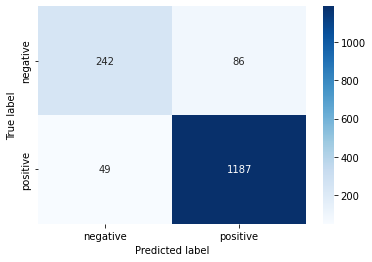

In [28]:
plot_matrix(y_test, y_pred)

In [29]:
pred_result = false_cases(X_test, y_test, y_pred)
pred_result

,sentence,label,prediction
0,setuju peserta dilanjutkan ketok palu sid...,0,1
1,rispek sah,1,0
8,daftar kekerasan seksual diatur,0,1
28,kebut aturan turunan dirasakan implementas...,1,0
30,sepi kayaknya sidang paripurna yak disahk...,0,1
...,...,...,...
1522,mengakomodasi pemidanaan pelaku penyimpanga...,0,1
1526,persetujuan dewan perwakilan rakyat undang...,0,1
1527,fokus kasih perlindungan korban ks hak k...,0,1
1538,kebodohan predator seksual gamau bikin em...,0,1


## CNN

### Fastext

In [30]:
# cnn_fasttext = Sequential()
# cnn_fasttext.add(Embedding(nb_words, 33, input_length=max_seq_len, weights=[embedding_matrix])) #embedding_matrix_2 = word2vec ; embedding_matrix = fasttext
# cnn_fasttext.add(Conv1D(32, kernel_size=5, activation='relu'))
# cnn_fasttext.add(MaxPooling1D(pool_size=2))
# cnn_fasttext.add(Conv1D(64, kernel_size=5, activation='relu'))
# cnn_fasttext.add(MaxPooling1D(pool_size=2))
# cnn_fasttext.add(Flatten())
# cnn_fasttext.add(Dense(10, activation='relu'))
# cnn_fasttext.add(Dropout(0.2))
# cnn_fasttext.add(Dense(2, activation='softmax'))
# cnn_fasttext.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# cnn_fasttext.summary()

# cnn_fasttext.fit(word_seq_train, y_seq_train, epochs=10, validation_data=(word_seq_test, y_seq_test))

In [31]:
# y_pred = cnn_fasttext.predict(word_seq_test, verbose=0)
# y_pred = np.argmax(y_pred, axis=1)

In [32]:
# print(classification_report(y_test, y_pred, target_names=target_names))

In [33]:
# plot_matrix(y_test, y_pred)

In [34]:
# pred_result = false_cases(X_test, y_test, y_pred)
# pred_result

### Word2Vec

In [35]:
cnn_word2vec = Sequential()
cnn_word2vec.add(Embedding(nb_words, 106, input_length=max_seq_len, weights=[embedding_matrix_2])) #embedding_matrix_2 = word2vec ; embedding_matrix = fasttext
cnn_word2vec.add(Conv1D(32, kernel_size=5, activation='relu'))
cnn_word2vec.add(MaxPooling1D(pool_size=2))
cnn_word2vec.add(Conv1D(64, kernel_size=5, activation='relu'))
cnn_word2vec.add(MaxPooling1D(pool_size=2))
cnn_word2vec.add(Flatten())
cnn_word2vec.add(Dense(10, activation='relu'))
cnn_word2vec.add(Dropout(0.2))
cnn_word2vec.add(Dense(2, activation='softmax'))
cnn_word2vec.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
cnn_word2vec.summary()

cnn_word2vec.fit(word_seq_train, y_seq_train, epochs=10, validation_data=(word_seq_test, y_seq_test))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 74, 106)           1182748   
                                                                 
 conv1d (Conv1D)             (None, 70, 32)            16992     
                                                                 
 max_pooling1d (MaxPooling1D  (None, 35, 32)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 31, 64)            10304     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 15, 64)           0         
 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 960)              

2022-08-18 15:39:02.904503: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8401


440/440 [==============================] - 14s 21ms/step - loss: 0.3905 - accuracy: 0.8263 - val_loss: 0.3091 - val_accuracy: 0.8721
Epoch 2/10
440/440 [==============================] - 1s 3ms/step - loss: 0.2697 - accuracy: 0.8811 - val_loss: 0.2656 - val_accuracy: 0.8900
Epoch 3/10
440/440 [==============================] - 1s 3ms/step - loss: 0.1973 - accuracy: 0.9266 - val_loss: 0.2836 - val_accuracy: 0.8945
Epoch 4/10
440/440 [==============================] - 1s 3ms/step - loss: 0.1466 - accuracy: 0.9492 - val_loss: 0.2847 - val_accuracy: 0.8951
Epoch 5/10
440/440 [==============================] - 1s 3ms/step - loss: 0.1118 - accuracy: 0.9645 - val_loss: 0.3446 - val_accuracy: 0.8939
Epoch 6/10
440/440 [==============================] - 1s 3ms/step - loss: 0.0909 - accuracy: 0.9711 - val_loss: 0.4023 - val_accuracy: 0.9028
Epoch 7/10
440/440 [==============================] - 1s 2ms/step - loss: 0.0774 - accuracy: 0.9760 - val_loss: 0.3820 - val_accuracy: 0.8971
Epoch 8/10
440/

In [36]:
y_pred = cnn_word2vec.predict(word_seq_test, verbose=0)
y_pred = np.argmax(y_pred, axis=1)

In [37]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.77      0.76      0.76       328
    positive       0.94      0.94      0.94      1236

    accuracy                           0.90      1564
   macro avg       0.85      0.85      0.85      1564
weighted avg       0.90      0.90      0.90      1564



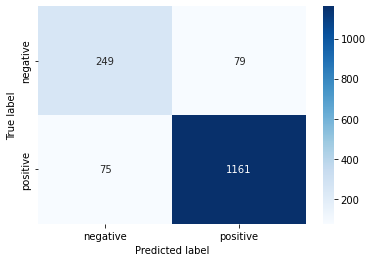

In [38]:
plot_matrix(y_test, y_pred)

In [39]:
pred_result = false_cases(X_test, y_test, y_pred)
pred_result

,sentence,label,prediction
23,capek capek disahkan nyampe pelaksanaan p...,0,1
30,sepi kayaknya sidang paripurna yak disahk...,0,1
96,bnyak cowok takut,0,1
98,wajib perlindungan hdp kekerasan seksualja...,1,0
99,harta rampasan perang peroleh allah mahap...,1,0
...,...,...,...
1507,diresmikannya teteskan airmata pahlawan,1,0
1510,sekian payung hukum pahlawan,1,0
1516,figur perempuan indonesia mendorong aktor ...,1,0
1527,fokus kasih perlindungan korban ks hak k...,0,1


## LSTM

### Fastext

In [40]:
# lstm_fasttext = Sequential()
# lstm_fasttext.add(Embedding(nb_words, 33, input_length=max_seq_len, weights=[embedding_matrix])) #embedding_matrix_2 = word2vec ; embedding_matrix = fasttext
# lstm_fasttext.add(LSTM(10, return_sequences=True))
# lstm_fasttext.add(LSTM(5))
# lstm_fasttext.add(Dropout(0.2))
# lstm_fasttext.add(Dense(5))
# lstm_fasttext.add(Dense(2, activation='softmax'))
# lstm_fasttext.summary()
# lstm_fasttext.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# lstm_fasttext.fit(word_seq_train, y_seq_train, epochs=10, validation_data=(word_seq_test, y_seq_test))

In [41]:
# y_pred = lstm_fasttext.predict(word_seq_test, verbose=0)
# y_pred = np.argmax(y_pred, axis=1)

In [42]:
# print(classification_report(y_test, y_pred, target_names=target_names))

In [43]:
# plot_matrix(y_test, y_pred)

In [44]:
# pred_result = false_cases(X_test, y_test, y_pred)
# pred_result

### Word2Vec

In [45]:
lstm_word2vec = Sequential()
lstm_word2vec.add(Embedding(nb_words, 106, input_length=max_seq_len, weights=[embedding_matrix_2])) #embedding_matrix_2 = word2vec ; embedding_matrix = fasttext
lstm_word2vec.add(LSTM(10, return_sequences=True))
lstm_word2vec.add(LSTM(5))
lstm_word2vec.add(Dropout(0.2))
lstm_word2vec.add(Dense(5))
lstm_word2vec.add(Dense(2, activation='softmax'))
lstm_word2vec.summary()
lstm_word2vec.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

lstm_word2vec.fit(word_seq_train, y_seq_train, epochs=10, validation_data=(word_seq_test, y_seq_test))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 74, 106)           1182748   
                                                                 
 lstm (LSTM)                 (None, 74, 10)            4680      
                                                                 
 lstm_1 (LSTM)               (None, 5)                 320       
                                                                 
 dropout_2 (Dropout)         (None, 5)                 0         
                                                                 
 dense_5 (Dense)             (None, 5)                 30        
                                                                 
 dense_6 (Dense)             (None, 2)                 12        
                                                                 
Total params: 1,187,790
Trainable params: 1,187,790
No

In [46]:
y_pred = lstm_word2vec.predict(word_seq_test, verbose=0)
y_pred = np.argmax(y_pred, axis=1)

In [47]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.83      0.83      0.83       328
    positive       0.96      0.95      0.96      1236

    accuracy                           0.93      1564
   macro avg       0.89      0.89      0.89      1564
weighted avg       0.93      0.93      0.93      1564



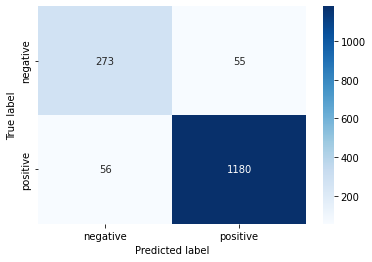

In [48]:
plot_matrix(y_test, y_pred)

In [49]:
pred_result = false_cases(X_test, y_test, y_pred)
pred_result

,sentence,label,prediction
8,daftar kekerasan seksual diatur,0,1
23,capek capek disahkan nyampe pelaksanaan p...,0,1
30,sepi kayaknya sidang paripurna yak disahk...,0,1
69,kekerasan mengganggu ketertiban aspirasi s...,1,0
98,wajib perlindungan hdp kekerasan seksualja...,1,0
...,...,...,...
1519,disahkan aturan turunan disusun,1,0
1522,mengakomodasi pemidanaan pelaku penyimpanga...,0,1
1527,fokus kasih perlindungan korban ks hak k...,0,1
1534,kp ite sg,1,0


## BLSTM

### Fastext

In [50]:
# blstm_fasttext = Sequential()
# blstm_fasttext.add(Embedding(nb_words, 33, input_length=max_seq_len, weights=[embedding_matrix])) #embedding_matrix_2 = word2vec ; embedding_matrix = fasttext
# blstm_fasttext.add(Bidirectional(LSTM(10, return_sequences=True)))
# blstm_fasttext.add(Bidirectional(LSTM(5)))
# blstm_fasttext.add(Dropout(0.2))
# blstm_fasttext.add(Dense(5))
# blstm_fasttext.add(Dense(2, activation='softmax'))
# blstm_fasttext.summary()
# blstm_fasttext.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# blstm_fasttext.fit(word_seq_train, y_seq_train, epochs=10, validation_data=(word_seq_test, y_seq_test))

In [51]:
# y_pred = blstm_fasttext.predict(word_seq_test, verbose=0)
# y_pred = np.argmax(y_pred, axis=1)

In [52]:
# print(classification_report(y_test, y_pred, target_names=target_names))

In [53]:
# plot_matrix(y_test, y_pred)

In [54]:
# pred_result = false_cases(X_test, y_test, y_pred)
# pred_result

### Word2Vec

In [55]:
blstm_word2vec = Sequential()
blstm_word2vec.add(Embedding(nb_words, 106, input_length=max_seq_len, weights=[embedding_matrix_2])) #embedding_matrix_2 = word2vec ; embedding_matrix = fasttext
blstm_word2vec.add(Bidirectional(LSTM(10, return_sequences=True)))
blstm_word2vec.add(Bidirectional(LSTM(5)))
blstm_word2vec.add(Dropout(0.2))
blstm_word2vec.add(Dense(5))
blstm_word2vec.add(Dense(2, activation='softmax'))
blstm_word2vec.summary()
blstm_word2vec.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

blstm_word2vec.fit(word_seq_train, y_seq_train, epochs=10, validation_data=(word_seq_test, y_seq_test))

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 74, 106)           1182748   
                                                                 
 bidirectional (Bidirectiona  (None, 74, 20)           9360      
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 10)               1040      
 nal)                                                            
                                                                 
 dropout_3 (Dropout)         (None, 10)                0         
                                                                 
 dense_7 (Dense)             (None, 5)                 55        
                                                                 
 dense_8 (Dense)             (None, 2)                

In [56]:
y_pred = blstm_word2vec.predict(word_seq_test, verbose=0)
y_pred = np.argmax(y_pred, axis=1)

In [57]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.86      0.78      0.82       328
    positive       0.94      0.97      0.95      1236

    accuracy                           0.93      1564
   macro avg       0.90      0.87      0.89      1564
weighted avg       0.93      0.93      0.93      1564



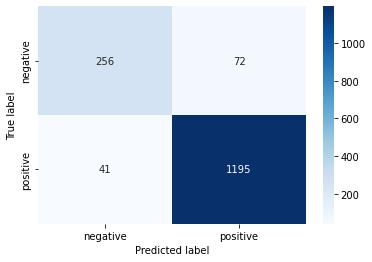

In [58]:
plot_matrix(y_test, y_pred)

In [59]:
pred_result = false_cases(X_test, y_test, y_pred)
pred_result

,sentence,label,prediction
1,rispek sah,1,0
8,daftar kekerasan seksual diatur,0,1
23,capek capek disahkan nyampe pelaksanaan p...,0,1
30,sepi kayaknya sidang paripurna yak disahk...,0,1
34,perjuangan demo siasia disahkan,1,0
...,...,...,...
1514,wni mesti berterimakasih beliau mengesahka...,1,0
1522,mengakomodasi pemidanaan pelaku penyimpanga...,0,1
1527,fokus kasih perlindungan korban ks hak k...,0,1
1534,kp ite sg,1,0


# Shallow Learning

## Feature Processing from embedding

### Word2Vec

In [60]:
X_word2vec = []
for x in X:
  temp = []
  for y in x.split():
    temp.append(np.mean(word_model.wv[y]))
  if(len(x.split()) > max_seq_len):
    temp = temp[0:max_seq_len]
  else:
    temp = list(np.pad(temp, (max_seq_len-len(x.split()),0), 'constant'))
  X_word2vec.append(temp)

scaler_word2vec = MinMaxScaler()
scaler_word2vec.fit(X_word2vec)

MinMaxScaler()

In [61]:
X_train_word2vec = []
for x in X_train:
  temp = []
  for y in x.split():
    temp.append(np.mean(word_model.wv[y]))
  if(len(x.split()) > max_seq_len):
    temp = temp[0:max_seq_len]
  else:
    temp = list(np.pad(temp, (max_seq_len-len(x.split()),0), 'constant'))
  X_train_word2vec.append(temp)

X_train_word2vec_scaled = scaler_word2vec.transform(X_train_word2vec)

In [62]:
X_test_word2vec = []
for x in X_test:
  temp = []
  for y in x.split():
    temp.append(np.mean(word_model.wv[y]))
  if(len(x.split()) > max_seq_len):
    temp = temp[0:max_seq_len]
  else:
    temp = list(np.pad(temp, (max_seq_len-len(x.split()),0), 'constant'))
  X_test_word2vec.append(temp)

X_test_word2vec_scaled = scaler_word2vec.transform(X_test_word2vec)

### Fasttext

In [63]:
# X_fasttext = []
# for x in X:
#   temp = []
#   for y in x.split():
#     temp.append(np.mean(model_fasttext[y]))
#   if(len(x.split()) > max_seq_len):
#     temp = temp[0:max_seq_len]
#   else:
#     temp = list(np.pad(temp, (max_seq_len-len(x.split()),0), 'constant'))
#   X_fasttext.append(temp)

# scaler_fasttext = MinMaxScaler()
# scaler_fasttext.fit(X_fasttext)

In [64]:
# X_train_fasttext = []
# for x in X_train:
#   temp = []
#   for y in x.split():
#     temp.append(np.mean(model_fasttext[y]))
#   if(len(x.split()) > max_seq_len):
#     temp = temp[0:max_seq_len]
#   else:
#     temp = list(np.pad(temp, (max_seq_len-len(x.split()),0), 'constant'))
#   X_train_fasttext.append(temp)

# X_train_fasttext_scaled = scaler_fasttext.transform(X_train_fasttext)

In [65]:
# X_test_fasttext = []
# for x in X_test:
#   temp = []
#   for y in x.split():
#     temp.append(np.mean(model_fasttext[y]))
#   if(len(x.split()) > max_seq_len):
#     temp = temp[0:max_seq_len]
#   else:
#     temp = list(np.pad(temp, (max_seq_len-len(x.split()),0), 'constant'))
#   X_test_fasttext.append(temp)

# X_test_fasttext_scaled = scaler_fasttext.transform(X_test_fasttext)

## SVM

### TF-IDF

In [66]:
SVM = svm.SVC(C=1.0, kernel='linear', degree=2, gamma='auto')
SVM.fit(tfidf_train,y_train)
y_pred = SVM.predict(tfidf_test)

In [67]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.89      0.77      0.82       328
    positive       0.94      0.97      0.96      1236

    accuracy                           0.93      1564
   macro avg       0.92      0.87      0.89      1564
weighted avg       0.93      0.93      0.93      1564



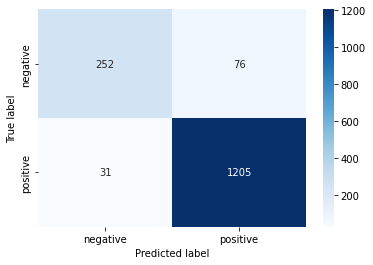

In [68]:
plot_matrix(y_test, y_pred)

### Word2Vec

In [69]:
SVM = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVM.fit(X_train_word2vec_scaled,y_train)
y_pred = SVM.predict(X_test_word2vec_scaled)

In [70]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.00      0.00      0.00       328
    positive       0.79      1.00      0.88      1236

    accuracy                           0.79      1564
   macro avg       0.40      0.50      0.44      1564
weighted avg       0.62      0.79      0.70      1564



/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

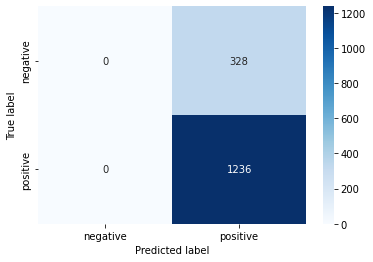

In [71]:
plot_matrix(y_test, y_pred)

### Fasttext

In [72]:
# SVM = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
# SVM.fit(X_train_fasttext_scaled,y_train)
# y_pred = SVM.predict(X_test_fasttext_scaled)

In [73]:
# print(classification_report(y_test, y_pred, target_names=target_names))

In [74]:
# plot_matrix(y_test, y_pred)

### Bag of Words

In [75]:
SVM = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVM.fit(countword_train,y_train)
y_pred = SVM.predict(countword_test)

In [76]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.90      0.81      0.85       328
    positive       0.95      0.98      0.96      1236

    accuracy                           0.94      1564
   macro avg       0.93      0.89      0.91      1564
weighted avg       0.94      0.94      0.94      1564



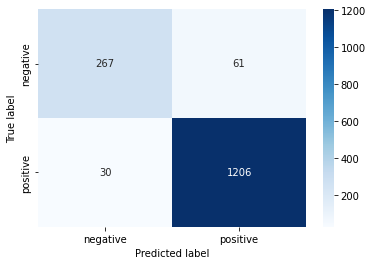

In [77]:
plot_matrix(y_test, y_pred)

## Naive Bayes

### TF-IDF

In [78]:
Naive = naive_bayes.MultinomialNB()
Naive.fit(tfidf_train,y_train)
y_pred = Naive.predict(tfidf_test)

In [79]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.84      0.52      0.65       328
    positive       0.89      0.97      0.93      1236

    accuracy                           0.88      1564
   macro avg       0.86      0.75      0.79      1564
weighted avg       0.88      0.88      0.87      1564



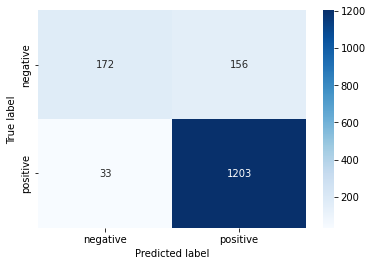

In [80]:
plot_matrix(y_test, y_pred)

### Word2Vec

In [81]:
Naive = naive_bayes.MultinomialNB()
Naive.fit(X_train_word2vec_scaled,y_train)
y_pred = Naive.predict(X_test_word2vec_scaled)

In [82]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.00      0.00      0.00       328
    positive       0.79      1.00      0.88      1236

    accuracy                           0.79      1564
   macro avg       0.40      0.50      0.44      1564
weighted avg       0.62      0.79      0.70      1564



/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

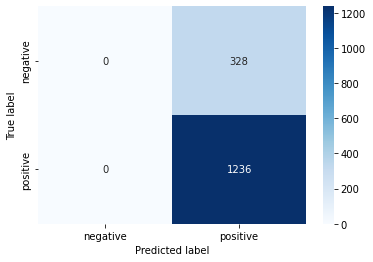

In [83]:
plot_matrix(y_test, y_pred)

### Fasttext

In [84]:
# Naive = naive_bayes.MultinomialNB()
# Naive.fit(X_train_fasttext_scaled,y_train)
# y_pred = Naive.predict(X_test_fasttext_scaled)

In [85]:
# print(classification_report(y_test, y_pred, target_names=target_names))

In [86]:
# plot_matrix(y_test, y_pred)

### Bag of Words

In [87]:
Naive = naive_bayes.MultinomialNB()
Naive.fit(countword_train,y_train)
y_pred = Naive.predict(countword_test)

In [88]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.71      0.72      0.72       328
    positive       0.92      0.92      0.92      1236

    accuracy                           0.88      1564
   macro avg       0.82      0.82      0.82      1564
weighted avg       0.88      0.88      0.88      1564



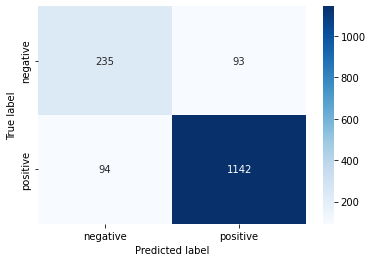

In [89]:
plot_matrix(y_test, y_pred)

## Logistic Regression

### TF-IDF

In [90]:
logistic = LogisticRegression(C=5e1, solver='lbfgs', multi_class='multinomial', random_state=17, n_jobs=4)
logistic.fit(tfidf_train,y_train)
y_pred = logistic.predict(tfidf_test)

/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [91]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.89      0.81      0.85       328
    positive       0.95      0.97      0.96      1236

    accuracy                           0.94      1564
   macro avg       0.92      0.89      0.91      1564
weighted avg       0.94      0.94      0.94      1564



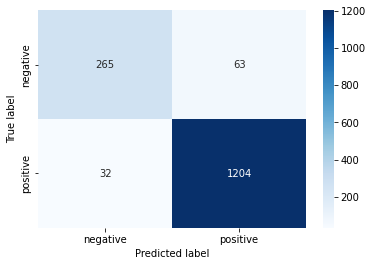

In [92]:
plot_matrix(y_test, y_pred)

### Word2Vec

In [93]:
logistic = LogisticRegression(C=5e1, solver='lbfgs', multi_class='multinomial', random_state=17, n_jobs=4)
logistic .fit(X_train_word2vec_scaled,y_train)
y_pred = logistic .predict(X_test_word2vec_scaled)

/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [94]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.33      0.01      0.01       328
    positive       0.79      1.00      0.88      1236

    accuracy                           0.79      1564
   macro avg       0.56      0.50      0.45      1564
weighted avg       0.69      0.79      0.70      1564



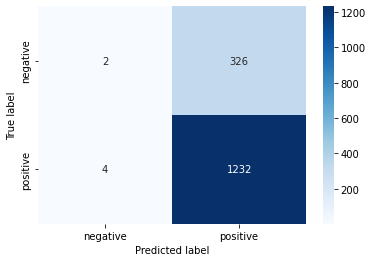

In [95]:
plot_matrix(y_test, y_pred)

### Fasttext

In [96]:
# logistic = LogisticRegression(C=5e1, solver='lbfgs', multi_class='multinomial', random_state=17, n_jobs=4)
# logistic.fit(X_train_fasttext_scaled,y_train)
# y_pred = logistic.predict(X_test_fasttext_scaled)

In [97]:
# print(classification_report(y_test, y_pred, target_names=target_names))

In [98]:
# plot_matrix(y_test, y_pred)

### Bag of Words

In [99]:
logistic = LogisticRegression(C=5e1, solver='lbfgs', multi_class='multinomial', random_state=17, n_jobs=4)
logistic.fit(countword_train,y_train)
y_pred = logistic.predict(countword_test)

/media/DATA/Apps-Files/Linux/Miniconda3/envs/data-mining/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [100]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.89      0.82      0.86       328
    positive       0.95      0.97      0.96      1236

    accuracy                           0.94      1564
   macro avg       0.92      0.90      0.91      1564
weighted avg       0.94      0.94      0.94      1564



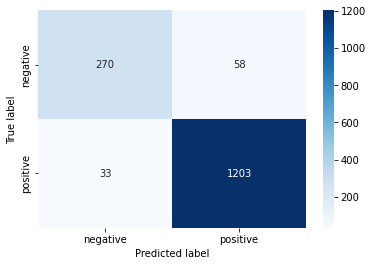

In [101]:
plot_matrix(y_test, y_pred)

## KNN

### TF-IDF

In [102]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(tfidf_train,y_train)
y_pred = logistic.predict(tfidf_test)

In [103]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.96      0.52      0.67       328
    positive       0.89      0.99      0.94      1236

    accuracy                           0.89      1564
   macro avg       0.92      0.75      0.80      1564
weighted avg       0.90      0.89      0.88      1564



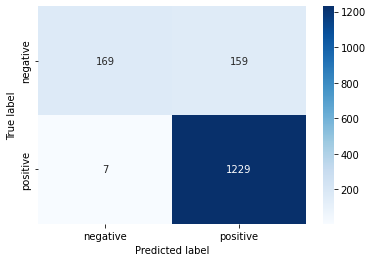

In [104]:
plot_matrix(y_test, y_pred)

### Word2Vec

In [105]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train_word2vec_scaled,y_train)
y_pred = knn.predict(X_test_word2vec_scaled)

In [106]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.71      0.44      0.55       328
    positive       0.87      0.95      0.91      1236

    accuracy                           0.85      1564
   macro avg       0.79      0.70      0.73      1564
weighted avg       0.83      0.85      0.83      1564



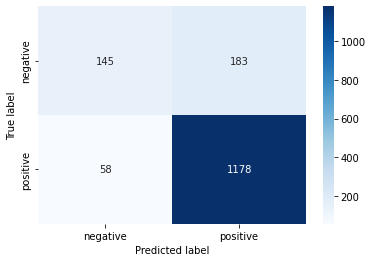

In [107]:
plot_matrix(y_test, y_pred)

### Fasttext

In [108]:
# knn = KNeighborsClassifier(n_neighbors=7)
# knn.fit(X_train_fasttext_scaled,y_train)
# y_pred = knn.predict(X_test_fasttext_scaled)

In [109]:
# print(classification_report(y_test, y_pred, target_names=target_names))

In [110]:
# plot_matrix(y_test, y_pred)

### Bag of Words

In [111]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(countword_train,y_train)
y_pred = knn.predict(countword_test)

In [112]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    negative       0.95      0.38      0.54       328
    positive       0.86      0.99      0.92      1236

    accuracy                           0.87      1564
   macro avg       0.90      0.69      0.73      1564
weighted avg       0.88      0.87      0.84      1564



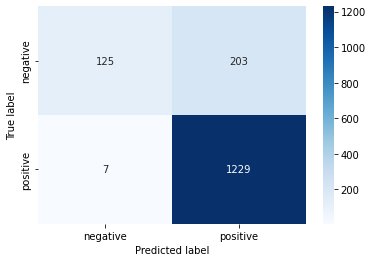

In [113]:
plot_matrix(y_test, y_pred)